In [65]:
import pandas as pd
import os
from warnings import filterwarnings
filterwarnings('ignore')
import numpy as np
import folium
from folium.plugins import MarkerCluster
import matplotlib.pyplot as plt
import datetime

co2data = pd.read_csv('/Users/robertasavino/Desktop/EPICODE- DATA ANALYST/PROGETTO FINALE/owid-co2-data.csv')

In [2]:
os.getcwd()

'/Users/robertasavino/Desktop/EPICODE- DATA ANALYST/PROGETTO FINALE'

In [66]:
#dopo aver importato le librerie utili, non mi leggeva il file csv per cui ho provato "change directory", che ha funzionato
os.chdir('/Users/robertasavino/Desktop/EPICODE- DATA ANALYST/PROGETTO FINALE')
energydata = pd.read_csv('owid-energy-data.csv')

In [4]:
co2data

,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,...,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share
0,Afghanistan,1850,AFG,3752993.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Afghanistan,1851,AFG,3767956.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.165,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
2,Afghanistan,1852,AFG,3783940.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.164,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
3,Afghanistan,1853,AFG,3800954.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.164,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
4,Afghanistan,1854,AFG,3818038.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.163,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48053,Zimbabwe,2018,ZWE,15052191.0,2.271535e+10,0.558,0.037,10.715,1.419,15.265,...,NaN,0.114,0.001,0.001,0.002,0.0,116.76,29.37,-0.088,-0.825
48054,Zimbabwe,2019,ZWE,15354606.0,NaN,0.473,0.031,9.775,-0.939,-8.765,...,NaN,0.113,0.001,0.001,0.002,0.0,116.03,28.70,0.143,1.463
48055,Zimbabwe,2020,ZWE,15669663.0,NaN,0.496,0.032,7.850,-1.926,-19.700,...,NaN,0.112,0.001,0.001,0.002,0.0,113.20,25.99,0.818,10.421
48056,Zimbabwe,2021,ZWE,15993525.0,NaN,0.531,0.033,8.396,0.547,6.962,...,NaN,0.111,0.001,0.001,0.002,0.0,NaN,NaN,1.088,12.956


In [5]:
energydata

,country,year,iso_code,population,gdp,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,...,solar_share_elec,solar_share_energy,wind_cons_change_pct,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_electricity,wind_energy_per_capita,wind_share_elec,wind_share_energy
0,ASEAN (Ember),2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN
1,ASEAN (Ember),2001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN
2,ASEAN (Ember),2002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN
3,ASEAN (Ember),2003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN
4,ASEAN (Ember),2004,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.000,NaN,NaN,NaN,NaN,NaN,0.0,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21585,Zimbabwe,2018,ZWE,15052191.0,2.271535e+10,NaN,NaN,NaN,NaN,25.910,...,0.218,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN
21586,Zimbabwe,2019,ZWE,15354606.0,NaN,NaN,NaN,NaN,NaN,24.748,...,0.364,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN
21587,Zimbabwe,2020,ZWE,15669663.0,NaN,NaN,NaN,NaN,NaN,22.336,...,0.395,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN
21588,Zimbabwe,2021,ZWE,15993525.0,NaN,NaN,NaN,NaN,NaN,23.760,...,0.498,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,NaN


In [69]:
#Voglio eliminare tutte le righe senza risultati per il livello di co2
df = co2data[co2data['co2'].notna()]

In [7]:
#voglio i singoli paesi (associati nel dataset ad un iso code) e non i continenti, per cui li escludo attraverso notna
df=df[df['iso_code'].notna()]

In [8]:
df

,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,...,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share
99,Afghanistan,1949,AFG,7356890.0,NaN,0.000,0.000,0.015,NaN,NaN,...,NaN,0.129,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
100,Afghanistan,1950,AFG,7480464.0,9.421400e+09,0.000,0.000,0.084,0.070,475.000,...,NaN,0.129,0.000,0.000,0.000,0.0,NaN,NaN,NaN,NaN
101,Afghanistan,1951,AFG,7571542.0,9.692280e+09,0.000,0.000,0.092,0.007,8.696,...,NaN,0.129,0.000,0.000,0.001,0.0,NaN,NaN,NaN,NaN
102,Afghanistan,1952,AFG,7667534.0,1.001733e+10,0.000,0.000,0.092,0.000,0.000,...,NaN,0.129,0.000,0.000,0.001,0.0,NaN,NaN,NaN,NaN
103,Afghanistan,1953,AFG,7764549.0,1.063052e+10,0.000,0.000,0.106,0.015,16.000,...,NaN,0.129,0.000,0.000,0.001,0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48053,Zimbabwe,2018,ZWE,15052191.0,2.271535e+10,0.558,0.037,10.715,1.419,15.265,...,NaN,0.114,0.001,0.001,0.002,0.0,116.76,29.37,-0.088,-0.825
48054,Zimbabwe,2019,ZWE,15354606.0,NaN,0.473,0.031,9.775,-0.939,-8.765,...,NaN,0.113,0.001,0.001,0.002,0.0,116.03,28.70,0.143,1.463
48055,Zimbabwe,2020,ZWE,15669663.0,NaN,0.496,0.032,7.850,-1.926,-19.700,...,NaN,0.112,0.001,0.001,0.002,0.0,113.20,25.99,0.818,10.421
48056,Zimbabwe,2021,ZWE,15993525.0,NaN,0.531,0.033,8.396,0.547,6.962,...,NaN,0.111,0.001,0.001,0.002,0.0,NaN,NaN,1.088,12.956


In [10]:
#Merge tra i dati di co2 e energia per i paesi
new_df = pd.merge(df, energydata,  how='left', left_on=['country','year','iso_code','population','gdp'], right_on = ['country','year','iso_code','population','gdp'])

In [11]:
#Mostra al massimo 50 righe del dataset
pd.set_option('display.max_rows',50)

In [12]:
#Mostra il nuovo dataset per confermare che il merge funziona bene
new_df

,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,co2_including_luc,co2_including_luc_growth_abs,co2_including_luc_growth_prct,co2_including_luc_per_capita,co2_including_luc_per_gdp,co2_including_luc_per_unit_energy,co2_per_capita,co2_per_gdp,co2_per_unit_energy,coal_co2,coal_co2_per_capita,consumption_co2,consumption_co2_per_capita,consumption_co2_per_gdp,cumulative_cement_co2,cumulative_co2,cumulative_co2_including_luc,cumulative_coal_co2,cumulative_flaring_co2,cumulative_gas_co2,cumulative_luc_co2,cumulative_oil_co2,cumulative_other_co2,energy_per_capita_x,energy_per_gdp_x,flaring_co2,flaring_co2_per_capita,gas_co2,gas_co2_per_capita,ghg_excluding_lucf_per_capita,ghg_per_capita,land_use_change_co2,land_use_change_co2_per_capita,methane,methane_per_capita,nitrous_oxide,nitrous_oxide_per_capita,oil_co2,oil_co2_per_capita,other_co2_per_capita,other_industry_co2,primary_energy_consumption_x,share_global_cement_co2,share_global_co2,share_global_co2_including_luc,share_global_coal_co2,share_global_cumulative_cement_co2,share_global_cumulative_co2,share_global_cumulative_co2_including_luc,share_global_cumulative_coal_co2,share_global_cumulative_flaring_co2,share_global_cumulative_gas_co2,share_global_cumulative_luc_co2,share_global_cumulative_oil_co2,share_global_cumulative_other_co2,share_global_flaring_co2,share_global_gas_co2,share_global_luc_co2,share_global_oil_co2,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,biofuel_electricity,biofuel_share_elec,biofuel_share_energy,carbon_intensity_elec,coal_cons_change_pct,coal_cons_change_twh,coal_cons_per_capita,coal_consumption,coal_elec_per_capita,coal_electricity,coal_prod_change_pct,coal_prod_change_twh,coal_prod_per_capita,coal_production,coal_share_elec,coal_share_energy,electricity_demand,electricity_generation,electricity_share_energy,energy_cons_change_pct,energy_cons_change_twh,energy_per_capita_y,energy_per_gdp_y,fossil_cons_change_pct,fossil_cons_change_twh,fossil_elec_per_capita,fossil_electricity,fossil_energy_per_capita,fossil_fuel_consumption,fossil_share_elec,fossil_share_energy,gas_cons_change_pct,gas_cons_change_twh,gas_consumption,gas_elec_per_capita,gas_electricity,gas_energy_per_capita,gas_prod_change_pct,gas_prod_change_twh,gas_prod_per_capita,gas_production,gas_share_elec,gas_share_energy,greenhouse_gas_emissions,hydro_cons_change_pct,hydro_cons_change_twh,hydro_consumption,hydro_elec_per_capita,hydro_electricity,hydro_energy_per_capita,hydro_share_elec,hydro_share_energy,low_carbon_cons_change_pct,low_carbon_cons_change_twh,low_carbon_consumption,low_carbon_elec_per_capita,low_carbon_electricity,low_carbon_energy_per_capita,low_carbon_share_elec,low_carbon_share_energy,net_elec_imports,net_elec_imports_share_demand,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_electricity,nuclear_energy_per_capita,nuclear_share_elec,nuclear_share_energy,oil_cons_change_pct,oil_cons_change_twh,oil_consumption,oil_elec_per_capita,oil_electricity,oil_energy_per_capita,oil_prod_change_pct,oil_prod_change_twh,oil_prod_per_capita,oil_production,oil_share_elec,oil_share_energy,other_renewable_consumption,other_renewable_electricity,other_renewable_exc_biofuel_electricity,other_renewables_cons_change_pct,other_renewables_cons_change_twh,other_renewables_elec_per_capita,other_renewables_elec_per_capita_exc_biofuel,other_renewables_energy_per_capita,other_renewables_share_elec,other_renewables_share_elec_exc_biofuel,other_renewables_share_energy,per_capita_electricity,primary_energy_consumption_y,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables

In [13]:
#Calcola le nuove variabili co2 pro capite e co2 per unità di energia
new_df['co2_per_capita']=new_df["co2"]/new_df["population"]
new_df['co2_per_unit_of_energy']=new_df["co2_per_capita"]/new_df["energy_per_capita_x"]

In [14]:
#Media CO2 pro capite per anno 

media_anno_co2_capite=new_df.groupby(['year'])['co2_per_capita'].mean().dropna().reset_index()

In [15]:
#Seleziona il paese con il co2_per_capita più alto ogni anno
max_country=new_df.groupby(['year'])['co2_per_capita'].max().dropna().reset_index()

In [16]:

media_anno_co2_capite

,year,co2_per_capita
0,1750,8.349327e-08
1,1760,8.919392e-08
2,1770,1.052314e-07
3,1780,1.210054e-07
4,1790,1.365883e-07
...,...,...
223,2018,4.887646e-06
224,2019,4.799126e-06
225,2020,4.476334e-06
226,2021,4.626093e-06


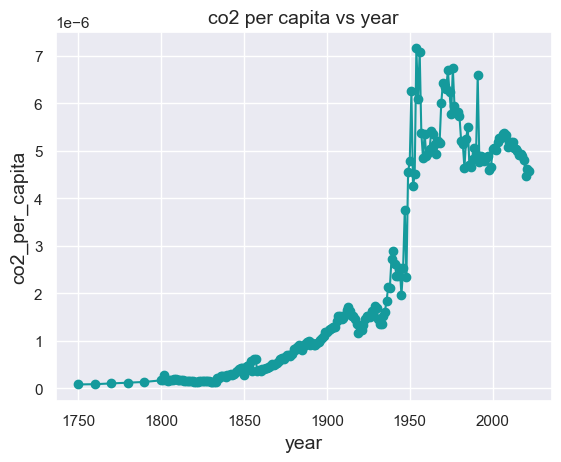

In [17]:
#Grafico a linee media co2 pro capite all'anno
plt.plot(media_anno_co2_capite['year'], media_anno_co2_capite['co2_per_capita'], color='#159A9C', marker='o')
plt.title('co2 per capita vs year', fontsize=14)
plt.xlabel('year', fontsize=14)
plt.ylabel('co2_per_capita', fontsize=14)
plt.grid(True)
plt.show()

In [18]:
#Sottoinsieme di una selezione di nazioni
UK=new_df[new_df['country']=="United Kingdom"]
US=new_df[new_df['country']=="United States"]
China=new_df[new_df['country']=="China"]
Italy=new_df[new_df['country']=="Italy"]

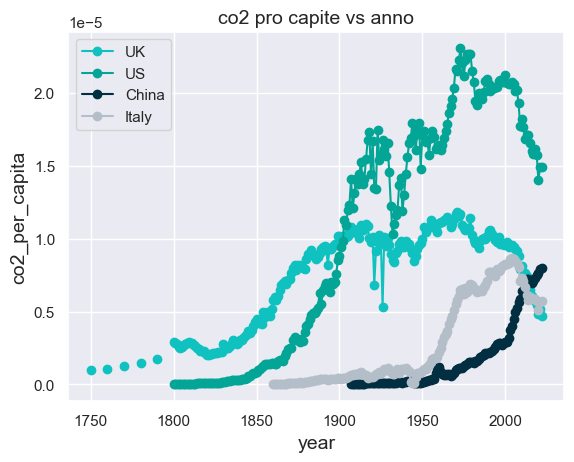

In [19]:
# Traccio un grafico (plot) dei dati di Regno Unito, Stati Uniti, Cina e Italia co2 pro capite all'anno utilizzando la palette di colori 
plt.plot(UK['year'], UK['co2_per_capita'],color = '#0FC2C0', marker='o', label="UK")
plt.plot(US['year'], US['co2_per_capita'],color= '#03A696', marker='o', label="US")
plt.plot(China['year'], China['co2_per_capita'], color= '#012E40', marker='o', label="China")
plt.plot(Italy['year'], Italy['co2_per_capita'], color= '#B4BEC9', marker='o', label="Italy")

plt.legend(loc="upper left")
plt.title('co2 pro capite vs anno', fontsize=14)
plt.xlabel('year', fontsize=14)
plt.ylabel('co2_per_capita', fontsize=14)
plt.grid(True)
plt.show()

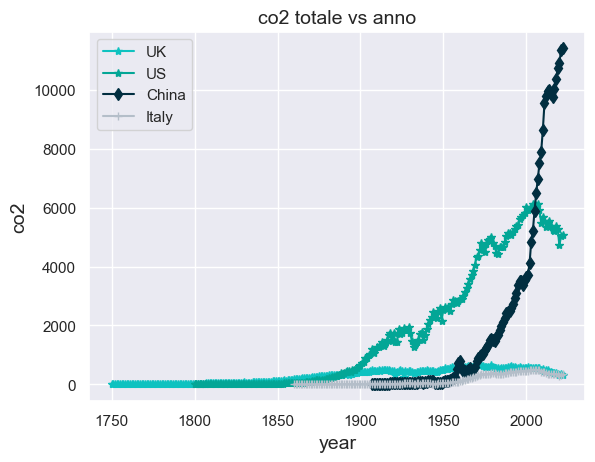

In [20]:
# Traccio un grafico (plot) dei dati di Regno Unito, Stati Uniti, Cina e Italia co2 totale all'anno utilizzando la palette di colori
plt.plot(UK['year'], UK['co2'], color = '#0FC2C0', marker='*',label="UK")
plt.plot(US['year'], US['co2'], color= '#03A696', marker='*',label="US")
plt.plot(China['year'], China['co2'], color= '#012E40', marker='d',label="China")
plt.plot(Italy['year'], Italy['co2'], color='#B4BEC9', marker='+',label="Italy")

plt.legend(loc="upper left")
plt.title('co2 totale vs anno', fontsize=14)
plt.xlabel('year', fontsize=14)
plt.ylabel('co2', fontsize=14)
plt.grid(True)
plt.show()

In [71]:
#Trova l'indice (il numero delle righe) che presentano il valore massimo di co2_pro capite per ogni anno
idx = new_df.groupby('year')['co2_per_capita'].idxmax()
#max_scores = df.loc[idx]

In [72]:
#Elimina gli NA (i valori nulli)
idx=idx.dropna()

In [74]:
#Usa idx per trovare i paesi con il massimo livello di co2_pro_capite ogni anno (Usa idx per selezione le righe).
max_scores = new_df.loc[idx].reset_index()

In [75]:
#Cambia le impostazioni per mostrare tutte le righe
pd.set_option('display.max_rows', None)

In [76]:
max_scores

,index,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,co2_including_luc,co2_including_luc_growth_abs,co2_including_luc_growth_prct,co2_including_luc_per_capita,co2_including_luc_per_gdp,co2_including_luc_per_unit_energy,co2_per_capita,co2_per_gdp,co2_per_unit_energy,coal_co2,coal_co2_per_capita,consumption_co2,consumption_co2_per_capita,consumption_co2_per_gdp,cumulative_cement_co2,cumulative_co2,cumulative_co2_including_luc,cumulative_coal_co2,cumulative_flaring_co2,cumulative_gas_co2,cumulative_luc_co2,cumulative_oil_co2,cumulative_other_co2,energy_per_capita_x,energy_per_gdp_x,flaring_co2,flaring_co2_per_capita,gas_co2,gas_co2_per_capita,ghg_excluding_lucf_per_capita,ghg_per_capita,land_use_change_co2,land_use_change_co2_per_capita,methane,methane_per_capita,nitrous_oxide,nitrous_oxide_per_capita,oil_co2,oil_co2_per_capita,other_co2_per_capita,other_industry_co2,primary_energy_consumption_x,share_global_cement_co2,share_global_co2,share_global_co2_including_luc,share_global_coal_co2,share_global_cumulative_cement_co2,share_global_cumulative_co2,share_global_cumulative_co2_including_luc,share_global_cumulative_coal_co2,share_global_cumulative_flaring_co2,share_global_cumulative_gas_co2,share_global_cumulative_luc_co2,share_global_cumulative_oil_co2,share_global_cumulative_other_co2,share_global_flaring_co2,share_global_gas_co2,share_global_luc_co2,share_global_oil_co2,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,biofuel_electricity,biofuel_share_elec,biofuel_share_energy,carbon_intensity_elec,coal_cons_change_pct,coal_cons_change_twh,coal_cons_per_capita,coal_consumption,coal_elec_per_capita,coal_electricity,coal_prod_change_pct,coal_prod_change_twh,coal_prod_per_capita,coal_production,coal_share_elec,coal_share_energy,electricity_demand,electricity_generation,electricity_share_energy,energy_cons_change_pct,energy_cons_change_twh,energy_per_capita_y,energy_per_gdp_y,fossil_cons_change_pct,fossil_cons_change_twh,fossil_elec_per_capita,fossil_electricity,fossil_energy_per_capita,fossil_fuel_consumption,fossil_share_elec,fossil_share_energy,gas_cons_change_pct,gas_cons_change_twh,gas_consumption,gas_elec_per_capita,gas_electricity,gas_energy_per_capita,gas_prod_change_pct,gas_prod_change_twh,gas_prod_per_capita,gas_production,gas_share_elec,gas_share_energy,greenhouse_gas_emissions,hydro_cons_change_pct,hydro_cons_change_twh,hydro_consumption,hydro_elec_per_capita,hydro_electricity,hydro_energy_per_capita,hydro_share_elec,hydro_share_energy,low_carbon_cons_change_pct,low_carbon_cons_change_twh,low_carbon_consumption,low_carbon_elec_per_capita,low_carbon_electricity,low_carbon_energy_per_capita,low_carbon_share_elec,low_carbon_share_energy,net_elec_imports,net_elec_imports_share_demand,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_electricity,nuclear_energy_per_capita,nuclear_share_elec,nuclear_share_energy,oil_cons_change_pct,oil_cons_change_twh,oil_consumption,oil_elec_per_capita,oil_electricity,oil_energy_per_capita,oil_prod_change_pct,oil_prod_change_twh,oil_prod_per_capita,oil_production,oil_share_elec,oil_share_energy,other_renewable_consumption,other_renewable_electricity,other_renewable_exc_biofuel_electricity,other_renewables_cons_change_pct,other_renewables_cons_change_twh,other_renewables_elec_per_capita,other_renewables_elec_per_capita_exc_biofuel,other_renewables_energy_per_capita,other_renewables_share_elec,other_renewables_share_elec_exc_biofuel,other_renewables_share_energy,per_capita_electricity,primary_energy_consumption_y,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,rene

In [28]:
#Calcola il massimo complessivo (max_scores_overall) di CO2 per anno, che mostra i paesi con la più alta emissione di CO2. Usa la stessa procedura

idx2 = new_df.groupby('year')['co2'].idxmax()
idx2=idx2.dropna()
max_scores_overall = new_df.loc[idx2].reset_index()

In [29]:
max_scores_overall

,index,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,co2_including_luc,co2_including_luc_growth_abs,co2_including_luc_growth_prct,co2_including_luc_per_capita,co2_including_luc_per_gdp,co2_including_luc_per_unit_energy,co2_per_capita,co2_per_gdp,co2_per_unit_energy,coal_co2,coal_co2_per_capita,consumption_co2,consumption_co2_per_capita,consumption_co2_per_gdp,cumulative_cement_co2,cumulative_co2,cumulative_co2_including_luc,cumulative_coal_co2,cumulative_flaring_co2,cumulative_gas_co2,cumulative_luc_co2,cumulative_oil_co2,cumulative_other_co2,energy_per_capita_x,energy_per_gdp_x,flaring_co2,flaring_co2_per_capita,gas_co2,gas_co2_per_capita,ghg_excluding_lucf_per_capita,ghg_per_capita,land_use_change_co2,land_use_change_co2_per_capita,methane,methane_per_capita,nitrous_oxide,nitrous_oxide_per_capita,oil_co2,oil_co2_per_capita,other_co2_per_capita,other_industry_co2,primary_energy_consumption_x,share_global_cement_co2,share_global_co2,share_global_co2_including_luc,share_global_coal_co2,share_global_cumulative_cement_co2,share_global_cumulative_co2,share_global_cumulative_co2_including_luc,share_global_cumulative_coal_co2,share_global_cumulative_flaring_co2,share_global_cumulative_gas_co2,share_global_cumulative_luc_co2,share_global_cumulative_oil_co2,share_global_cumulative_other_co2,share_global_flaring_co2,share_global_gas_co2,share_global_luc_co2,share_global_oil_co2,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,biofuel_electricity,biofuel_share_elec,biofuel_share_energy,carbon_intensity_elec,coal_cons_change_pct,coal_cons_change_twh,coal_cons_per_capita,coal_consumption,coal_elec_per_capita,coal_electricity,coal_prod_change_pct,coal_prod_change_twh,coal_prod_per_capita,coal_production,coal_share_elec,coal_share_energy,electricity_demand,electricity_generation,electricity_share_energy,energy_cons_change_pct,energy_cons_change_twh,energy_per_capita_y,energy_per_gdp_y,fossil_cons_change_pct,fossil_cons_change_twh,fossil_elec_per_capita,fossil_electricity,fossil_energy_per_capita,fossil_fuel_consumption,fossil_share_elec,fossil_share_energy,gas_cons_change_pct,gas_cons_change_twh,gas_consumption,gas_elec_per_capita,gas_electricity,gas_energy_per_capita,gas_prod_change_pct,gas_prod_change_twh,gas_prod_per_capita,gas_production,gas_share_elec,gas_share_energy,greenhouse_gas_emissions,hydro_cons_change_pct,hydro_cons_change_twh,hydro_consumption,hydro_elec_per_capita,hydro_electricity,hydro_energy_per_capita,hydro_share_elec,hydro_share_energy,low_carbon_cons_change_pct,low_carbon_cons_change_twh,low_carbon_consumption,low_carbon_elec_per_capita,low_carbon_electricity,low_carbon_energy_per_capita,low_carbon_share_elec,low_carbon_share_energy,net_elec_imports,net_elec_imports_share_demand,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_electricity,nuclear_energy_per_capita,nuclear_share_elec,nuclear_share_energy,oil_cons_change_pct,oil_cons_change_twh,oil_consumption,oil_elec_per_capita,oil_electricity,oil_energy_per_capita,oil_prod_change_pct,oil_prod_change_twh,oil_prod_per_capita,oil_production,oil_share_elec,oil_share_energy,other_renewable_consumption,other_renewable_electricity,other_renewable_exc_biofuel_electricity,other_renewables_cons_change_pct,other_renewables_cons_change_twh,other_renewables_elec_per_capita,other_renewables_elec_per_capita_exc_biofuel,other_renewables_energy_per_capita,other_renewables_share_elec,other_renewables_share_elec_exc_biofuel,other_renewables_share_energy,per_capita_electricity,primary_energy_consumption_y,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,rene

In [30]:
#Confronto tra 1972 e 2022
data2022=new_df[new_df["year"]==2022]
data1972=new_df[new_df["year"]==1972]

In [31]:
data2022.to_csv("data2022.csv")

In [32]:
data1972.to_csv("data1972.csv")

In [33]:
data2022

,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,co2_including_luc,co2_including_luc_growth_abs,co2_including_luc_growth_prct,co2_including_luc_per_capita,co2_including_luc_per_gdp,co2_including_luc_per_unit_energy,co2_per_capita,co2_per_gdp,co2_per_unit_energy,coal_co2,coal_co2_per_capita,consumption_co2,consumption_co2_per_capita,consumption_co2_per_gdp,cumulative_cement_co2,cumulative_co2,cumulative_co2_including_luc,cumulative_coal_co2,cumulative_flaring_co2,cumulative_gas_co2,cumulative_luc_co2,cumulative_oil_co2,cumulative_other_co2,energy_per_capita_x,energy_per_gdp_x,flaring_co2,flaring_co2_per_capita,gas_co2,gas_co2_per_capita,ghg_excluding_lucf_per_capita,ghg_per_capita,land_use_change_co2,land_use_change_co2_per_capita,methane,methane_per_capita,nitrous_oxide,nitrous_oxide_per_capita,oil_co2,oil_co2_per_capita,other_co2_per_capita,other_industry_co2,primary_energy_consumption_x,share_global_cement_co2,share_global_co2,share_global_co2_including_luc,share_global_coal_co2,share_global_cumulative_cement_co2,share_global_cumulative_co2,share_global_cumulative_co2_including_luc,share_global_cumulative_coal_co2,share_global_cumulative_flaring_co2,share_global_cumulative_gas_co2,share_global_cumulative_luc_co2,share_global_cumulative_oil_co2,share_global_cumulative_other_co2,share_global_flaring_co2,share_global_gas_co2,share_global_luc_co2,share_global_oil_co2,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,biofuel_electricity,biofuel_share_elec,biofuel_share_energy,carbon_intensity_elec,coal_cons_change_pct,coal_cons_change_twh,coal_cons_per_capita,coal_consumption,coal_elec_per_capita,coal_electricity,coal_prod_change_pct,coal_prod_change_twh,coal_prod_per_capita,coal_production,coal_share_elec,coal_share_energy,electricity_demand,electricity_generation,electricity_share_energy,energy_cons_change_pct,energy_cons_change_twh,energy_per_capita_y,energy_per_gdp_y,fossil_cons_change_pct,fossil_cons_change_twh,fossil_elec_per_capita,fossil_electricity,fossil_energy_per_capita,fossil_fuel_consumption,fossil_share_elec,fossil_share_energy,gas_cons_change_pct,gas_cons_change_twh,gas_consumption,gas_elec_per_capita,gas_electricity,gas_energy_per_capita,gas_prod_change_pct,gas_prod_change_twh,gas_prod_per_capita,gas_production,gas_share_elec,gas_share_energy,greenhouse_gas_emissions,hydro_cons_change_pct,hydro_cons_change_twh,hydro_consumption,hydro_elec_per_capita,hydro_electricity,hydro_energy_per_capita,hydro_share_elec,hydro_share_energy,low_carbon_cons_change_pct,low_carbon_cons_change_twh,low_carbon_consumption,low_carbon_elec_per_capita,low_carbon_electricity,low_carbon_energy_per_capita,low_carbon_share_elec,low_carbon_share_energy,net_elec_imports,net_elec_imports_share_demand,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_electricity,nuclear_energy_per_capita,nuclear_share_elec,nuclear_share_energy,oil_cons_change_pct,oil_cons_change_twh,oil_consumption,oil_elec_per_capita,oil_electricity,oil_energy_per_capita,oil_prod_change_pct,oil_prod_change_twh,oil_prod_per_capita,oil_production,oil_share_elec,oil_share_energy,other_renewable_consumption,other_renewable_electricity,other_renewable_exc_biofuel_electricity,other_renewables_cons_change_pct,other_renewables_cons_change_twh,other_renewables_elec_per_capita,other_renewables_elec_per_capita_exc_biofuel,other_renewables_energy_per_capita,other_renewables_share_elec,other_renewables_share_elec_exc_biofuel,other_renewables_share_energy,per_capita_electricity,primary_energy_consumption_y,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables

In [34]:
data1972

,country,year,iso_code,population,gdp,cement_co2,cement_co2_per_capita,co2,co2_growth_abs,co2_growth_prct,co2_including_luc,co2_including_luc_growth_abs,co2_including_luc_growth_prct,co2_including_luc_per_capita,co2_including_luc_per_gdp,co2_including_luc_per_unit_energy,co2_per_capita,co2_per_gdp,co2_per_unit_energy,coal_co2,coal_co2_per_capita,consumption_co2,consumption_co2_per_capita,consumption_co2_per_gdp,cumulative_cement_co2,cumulative_co2,cumulative_co2_including_luc,cumulative_coal_co2,cumulative_flaring_co2,cumulative_gas_co2,cumulative_luc_co2,cumulative_oil_co2,cumulative_other_co2,energy_per_capita_x,energy_per_gdp_x,flaring_co2,flaring_co2_per_capita,gas_co2,gas_co2_per_capita,ghg_excluding_lucf_per_capita,ghg_per_capita,land_use_change_co2,land_use_change_co2_per_capita,methane,methane_per_capita,nitrous_oxide,nitrous_oxide_per_capita,oil_co2,oil_co2_per_capita,other_co2_per_capita,other_industry_co2,primary_energy_consumption_x,share_global_cement_co2,share_global_co2,share_global_co2_including_luc,share_global_coal_co2,share_global_cumulative_cement_co2,share_global_cumulative_co2,share_global_cumulative_co2_including_luc,share_global_cumulative_coal_co2,share_global_cumulative_flaring_co2,share_global_cumulative_gas_co2,share_global_cumulative_luc_co2,share_global_cumulative_oil_co2,share_global_cumulative_other_co2,share_global_flaring_co2,share_global_gas_co2,share_global_luc_co2,share_global_oil_co2,share_global_other_co2,share_of_temperature_change_from_ghg,temperature_change_from_ch4,temperature_change_from_co2,temperature_change_from_ghg,temperature_change_from_n2o,total_ghg,total_ghg_excluding_lucf,trade_co2,trade_co2_share,biofuel_cons_change_pct,biofuel_cons_change_twh,biofuel_cons_per_capita,biofuel_consumption,biofuel_elec_per_capita,biofuel_electricity,biofuel_share_elec,biofuel_share_energy,carbon_intensity_elec,coal_cons_change_pct,coal_cons_change_twh,coal_cons_per_capita,coal_consumption,coal_elec_per_capita,coal_electricity,coal_prod_change_pct,coal_prod_change_twh,coal_prod_per_capita,coal_production,coal_share_elec,coal_share_energy,electricity_demand,electricity_generation,electricity_share_energy,energy_cons_change_pct,energy_cons_change_twh,energy_per_capita_y,energy_per_gdp_y,fossil_cons_change_pct,fossil_cons_change_twh,fossil_elec_per_capita,fossil_electricity,fossil_energy_per_capita,fossil_fuel_consumption,fossil_share_elec,fossil_share_energy,gas_cons_change_pct,gas_cons_change_twh,gas_consumption,gas_elec_per_capita,gas_electricity,gas_energy_per_capita,gas_prod_change_pct,gas_prod_change_twh,gas_prod_per_capita,gas_production,gas_share_elec,gas_share_energy,greenhouse_gas_emissions,hydro_cons_change_pct,hydro_cons_change_twh,hydro_consumption,hydro_elec_per_capita,hydro_electricity,hydro_energy_per_capita,hydro_share_elec,hydro_share_energy,low_carbon_cons_change_pct,low_carbon_cons_change_twh,low_carbon_consumption,low_carbon_elec_per_capita,low_carbon_electricity,low_carbon_energy_per_capita,low_carbon_share_elec,low_carbon_share_energy,net_elec_imports,net_elec_imports_share_demand,nuclear_cons_change_pct,nuclear_cons_change_twh,nuclear_consumption,nuclear_elec_per_capita,nuclear_electricity,nuclear_energy_per_capita,nuclear_share_elec,nuclear_share_energy,oil_cons_change_pct,oil_cons_change_twh,oil_consumption,oil_elec_per_capita,oil_electricity,oil_energy_per_capita,oil_prod_change_pct,oil_prod_change_twh,oil_prod_per_capita,oil_production,oil_share_elec,oil_share_energy,other_renewable_consumption,other_renewable_electricity,other_renewable_exc_biofuel_electricity,other_renewables_cons_change_pct,other_renewables_cons_change_twh,other_renewables_elec_per_capita,other_renewables_elec_per_capita_exc_biofuel,other_renewables_energy_per_capita,other_renewables_share_elec,other_renewables_share_elec_exc_biofuel,other_renewables_share_energy,per_capita_electricity,primary_energy_consumption_y,renewables_cons_change_pct,renewables_cons_change_twh,renewables_consumption,renewables

In [36]:
#Energia rinnovabile proveniente da fonti rinnovabili

new_df["renewables_share_elec"]

#Seleziona i dati per tutto il mondo (non paesi nemmeno continenti) dai dataset co2 e energia
co2world=co2data[co2data["country"]=="World"]
energyworld=energydata[energydata["country"]=="World"]

#Fa un merge dei risultati
worldmerge= pd.merge(co2world, energyworld,  how='left', left_on=['country','year','iso_code','population','gdp'], right_on = ['country','year','iso_code','population','gdp'])
worldmerge

#Calcola co2 per capita dai dati per tutto il mondo
worldmerge['co2_per_capita']=worldmerge["co2"]/worldmerge["population"]





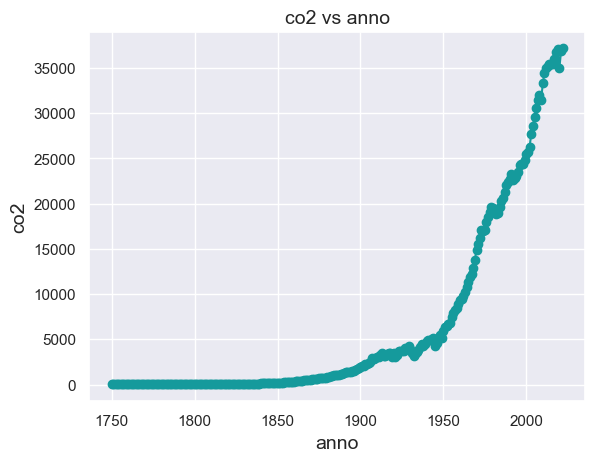

In [37]:
plt.plot(worldmerge['year'], worldmerge['co2'], color='#159A9C', marker='o')


plt.title('co2 vs anno', fontsize=14)
plt.xlabel('anno', fontsize=14)
plt.ylabel('co2', fontsize=14)
plt.grid(True)
plt.show()

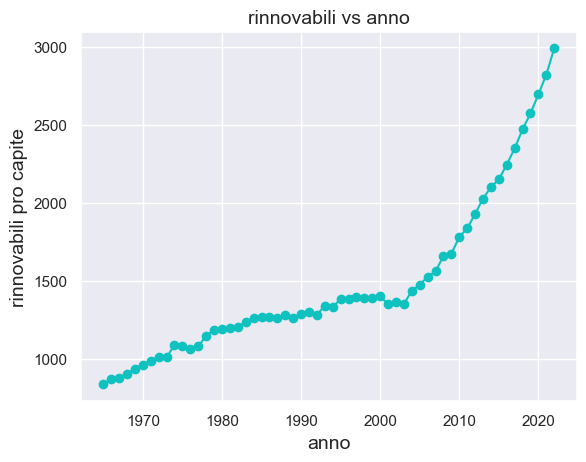

In [38]:
plt.plot(worldmerge['year'], worldmerge['renewables_energy_per_capita'], color='#0FC2C0', marker='o')


plt.title('rinnovabili vs anno', fontsize=14)
plt.xlabel('anno', fontsize=14)
plt.ylabel('rinnovabili pro capite', fontsize=14)
plt.grid(True)
plt.show()

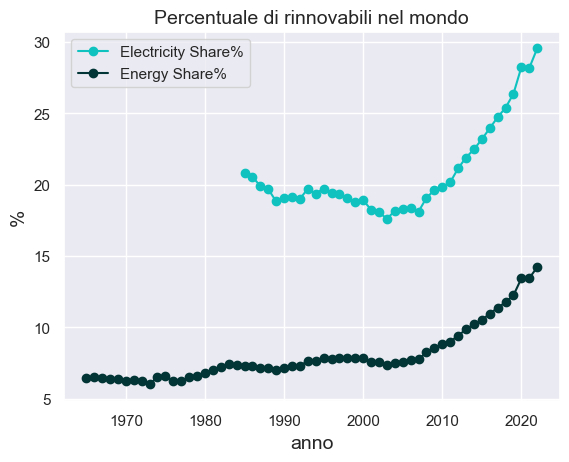

In [39]:
#Vediamo come è cambiata nel tempo la percentuale di fonti rinnovabili per l'elettricità e l'energia in totale.

plt.plot(worldmerge['year'], worldmerge['renewables_share_elec'], color='#0FC2C0', marker='o',label="Electricity Share%")
plt.plot(worldmerge['year'], worldmerge['renewables_share_energy'], color='#023535', marker='o',label="Energy Share%")

plt.legend(loc="upper left")
plt.title('Percentuale di rinnovabili nel mondo', fontsize=14)
plt.xlabel('anno', fontsize=14)
plt.ylabel('%', fontsize=14)
plt.grid(True)
plt.show()

In [77]:
#Apre Di Nuovo i dataset originali

co2data = pd.read_csv('owid-co2-data.csv')
energydata = pd.read_csv('owid-energy-data.csv')
#rawdata


<bound method Axes.pie of <Axes: title={'center': 'Quantità di CO2 emessa nel mondo nel 2022'}>>


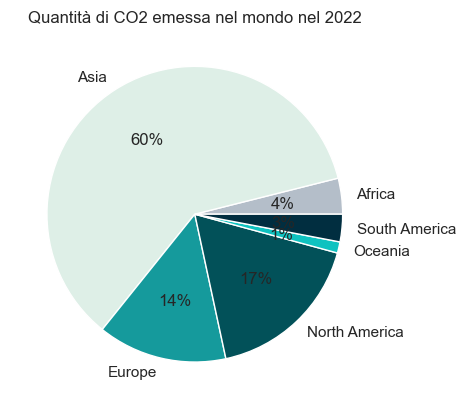

In [78]:
#Per Continente

#Fa un merge dai dataset co2 e energia
rawdata = pd.merge(co2data, energydata,  how='left', left_on=['country','year','iso_code','population','gdp'], right_on = ['country','year','iso_code','population','gdp'])
           
#Seleziona i dati dal anno 2022
datanew2022=rawdata[rawdata['year']==2022]

#Selezione le righe con i risultati dei continenti
Continents2022=datanew2022[datanew2022['country'].isin(['Asia', 'Africa','Europe','North America','South America','Oceania'])]

#Scegle i colori
colors=['#B4BEC9', '#DEEFE7', '#159A9C', '#025159', '#0FC2C0', '#012E40']

#Asia2022=datanew2022[data2022['country']=="Asia"]
#Africa2022=datanew2022[data2022['country']=="Africa"]
#Europe2022=datanew2022[data2022['country']=="Europe"]
#NA2022=datanew2022[data2022['country']=="North America"]
#SA2022=datanew2022[data2022['country']=="South America"]
#Oceania2022=datanew2022[data2022['country']=="Oceania"]
#
#Grafico a torta

#Crea le etichette e la grandezza delle fette di torta è determinata dalla quantità di CO2
labels = Continents2022['country']
sizes = Continents2022['co2']

#Crea il grafico con i colori scritto primo
fig, ax = plt.subplots()
plt.title("Quantità di CO2 emessa nel mondo nel 2022")
ax.pie(sizes, labels=labels, autopct='%1.0f%%',colors=colors)

print(ax.pie)






<bound method Axes.pie of <Axes: title={'center': 'Quantità di CO2 emessa nel mondo nel 1992'}>>


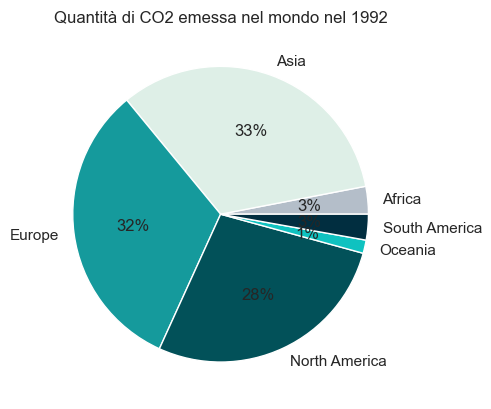

In [80]:
#Fa lo stesso per l'anno 1992, dove emergono distribuzioni percentuali molto diverse, le "tigri asiatiche" iniziano ad emergere
#la riduzione delle CO2 in Europa e Nord America si potrebbe attribuire ad un insieme di fattori, le crisi economiche, 
#la delocalizzazione della produzione verso paesi con manodopera a basso costo, le politiche messe in campo per la riduzione
#della CO2

rawdata = pd.merge(co2data, energydata,  how='left', left_on=['country','year','iso_code','population','gdp'], right_on = ['country','year','iso_code','population','gdp'])
           

datanew1992=rawdata[rawdata['year']==1992]

Continents1992=datanew1992[datanew1992['country'].isin(['Asia', 'Africa','Europe','North America','South America','Oceania'])]

colors=['#B4BEC9', '#DEEFE7', '#159A9C', '#025159', '#0FC2C0', '#012E40']



labels = Continents1992['country']
sizes = Continents1992['co2']

fig, ax = plt.subplots()
plt.title("Quantità di CO2 emessa nel mondo nel 1992")
ax.pie(sizes, labels=labels, autopct='%1.0f%%',colors=colors)

print(ax.pie)


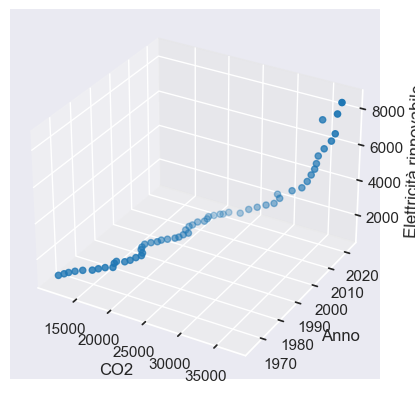

In [42]:
#Grafico 3D

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Creazione di una nuova figura
fig = plt.figure()

# Aggiunta di un subplot (grafico) 3D
ax = fig.add_subplot(111, projection='3d')

# Definizione dei dati da visualizzare
xs = worldmerge['co2']
ys = worldmerge['year']
zs = worldmerge['renewables_electricity']

# Definizione del marcatore
m = 'o'  

# Creazione dello scatter plot tridimensionale
ax.scatter(xs, ys, zs, marker=m)

# Etichette degli assi
ax.set_xlabel('CO2')
ax.set_ylabel('Anno')
ax.set_zlabel('Elettricità rinnovabile')

# Mostrare il grafico
plt.show()

In [43]:
#in quel grafico 3D si evidenzia come all'aumento della CO2 è aumentata anche la quantità di energia elettrica rinnovabile,
#il che ci fa riflettere sull'efficacia delle politiche messe in campo
#ma anche sul fatto che non si nota una drammatica diminuzione della CO2, per cui la produzione di energia rinnovabile 
#(pannelli solari, pale eoliche, auto elettriche, ecc.) ha un impatto sul pianeta, determina comunque un consumo di risorse
#anche non rinnovabili: quello che può diminuire è la quantità di CO2 emessa nel momento in cui un determinato impianto è 
#funzionante. Per approfondimenti sul tema, si consiglia la visione del documentario Planet of the humans 
#link--> https://www.youtube.com/watch?v=Zk11vI-7czE&t=3060s

In [61]:
world_map = folium.Map() #[lat, long]

# mostra la mappa del mondo
world_map

In [68]:
# Leggi i dati dal file CSV
energydata = pd.read_csv('owid-energy-data.csv')

mappa = folium.Map(location=[0, 0], zoom_start=2)

# Definisco le coordinate per i paesi che voglio prendere in considerazione
paesi_coordinate = {
    "Italy": (41.8719, 12.5674),
    "France": (46.6034, 1.8883),
    "Germany": (51.1657, 10.4515),
    "Spain": (40.4637, -3.7492),
    "United Kingdom": (55.3781, -3.4360),
    "China": (35.8617, 104.1954),
    "Russia": (61.5240, 105.3188),
    "United States": (37.0902, -95.7129),
    "India": (20.5937, 78.9629),
    "Netherlands": (52.1326, 5.2913),
    "South Korea": (35.9078, 127.7669),
    "North Korea": (40.3399, 127.5101),
    "Japan": (36.2048, 138.2529),
    "Brazil": (-14.2350, -51.9253),
    "Africa": (8.7832, 34.5085),
    "Pakistan": (30.3753, 69.3451)
}


# Itera sui dati per aggiungere marker sulla mappa: la funzione for permette di cercare i paesi attraverso il dataset una riga 
#alla volta.
for index, row in energydata.iterrows():
    # Controlla se il paese è presente nelle coordinate definite
    if row['country'] in paesi_coordinate:
        # Crea un marker (distringuibile come punto sulla mappa) per ogni riga del dataframe utilizzando le coordinate definite,
        #tramite la funzione .add_to si aggiunge il marcatore sulla mappa
        folium.Marker(location=paesi_coordinate[row['country']], 
                      popup=row['hydro_electricity'], 
                      tooltip=row['hydro_electricity']).add_to(mappa)

# Visualizza la mappa
mappa

In [ ]:
#visualizzo la mappa con il dato, ma decido di non proseguire ulteriormente in questa direzione, poichè
#stiamo procedendo in gruppo a fare mappe su power BI che risultano più gradevoli, con un'interazione più fluida. 